# Data Exploration 02

In this notebook, we'll explore the original data from the paper [Cell stress in cortical organoids impairs molecular subtype specification](https://www.nature.com/articles/s41586-020-1962-0#data-availability), which can be found [here](https://cells.ucsc.edu/?ds=organoidreportcard).

Let's first explore the data projected onto two dimensions via t-SNE.

In [8]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import umap
import plotly.express as px
import plotly.graph_objects as go

In [9]:
df_organoid = pd.read_csv('../data/processed/organoids_tsne.tsv', sep='\t', header=None)
meta_organoid = pd.read_csv('../data/processed/meta_organoid.tsv', sep='\t')
df_primary = pd.read_csv('../data/processed/primary_tsne.tsv', sep='\t', header=None)
meta_primary = pd.read_csv('../data/processed/meta_primary.tsv', sep='\t')

def clean_org(df):
    df = df.rename({0: 'V1'}, axis=1)
    df = df.merge(meta_organoid)
    df = df.set_index('V1')
    
    return df

def clean_prim(df):
    df = df.rename({0: 'Cell'}, axis=1)
    df = df.merge(meta_primary)
    df = df.set_index('Cell')
    
    return df

df_organoid = clean_org(df_organoid)
df_primary = clean_prim(df_primary)

In [10]:
df_primary

,1,2,Area,Individual,Age,Class,State,Type,Subtype,Cluster
Cell,,,,,,,,,,
AAACCTGAGCTGCCCA_50646,51407.0,23100.0,motor,GW14,14,Non-neuronal,Non-dividing,Radial Glia,oRG,26
AAACCTGAGCTTATCG_50647,52530.0,28725.0,motor,GW14,14,Non-neuronal,Non-dividing,Radial Glia,oRG,26
AAACCTGAGTATGACA_50652,27880.0,45612.0,motor,GW14,14,Neuron,Postmitotic,Excitatory Neuron,Layer VI Occipital,15
AAACCTGAGTCGCCGT_50654,34893.0,51146.0,motor,GW14,14,Neuron,Postmitotic,Excitatory Neuron,Newborn,35
AAACCTGCACCAGCAC_50657,27217.0,48240.0,motor,GW14,14,Neuron,Postmitotic,Excitatory Neuron,Layer VI Occipital,15
...,...,...,...,...,...,...,...,...,...,...
CS22_CTTAACTCAGTAGAGC_6016,22971.0,60653.0,Occipital cortex,CS22,10,Non-neuronal,Postmitotic,Mural,Mural,18
CS22_GGATGTTTCGACCAGC_6380,22858.0,60794.0,Occipital cortex,CS22,10,Non-neuronal,Postmitotic,Mural,Mural,18
CS22_GCTGCTTAGCACCGTC_6308,49952.0,8735.0,Occipital cortex,CS22,10,Neuron,Postmitotic,Excitatory Neuron,Deep Layer,27


In [29]:
# px.scatter(
#     x=df_organoid.loc[:, 1],
#     y=df_organoid.loc[:, 2],
#     color=df_organoid['Type'],
#     title='t-SNE projected (dim=2) organoid cell data, colored by type',
# ).update_traces(marker=dict(size=2)).show()

## Visualizing organoid data using seaborn

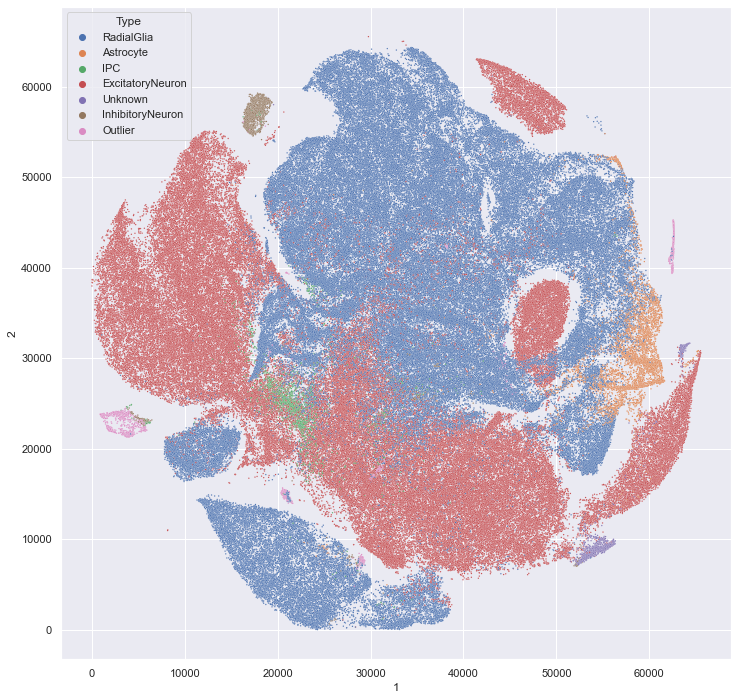

In [40]:
import seaborn as sns

sns.set(rc={"figure.figsize": (12, 12)})
type_plot = sns.scatterplot(data=df_organoid, x=1, y=2, hue='Type', s=2);

fig = type_plot.get_figure()
fig.savefig('type_cluster_organoid.png') 

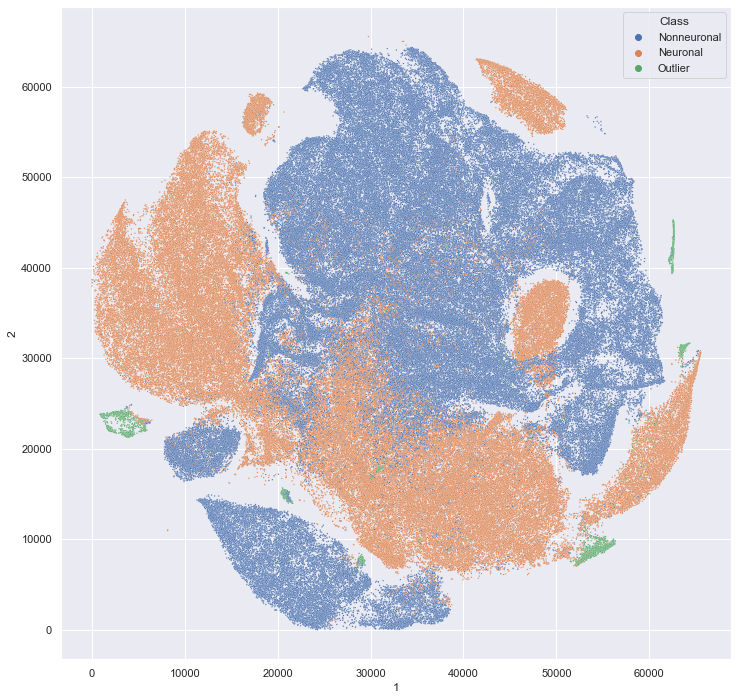

In [41]:
type_plot = sns.scatterplot(data=df_organoid, x=1, y=2, hue='Class', s=2);

fig = type_plot.get_figure()
fig.savefig('class_cluster_organoid.png') 

## Visualizing primary data using seaborn

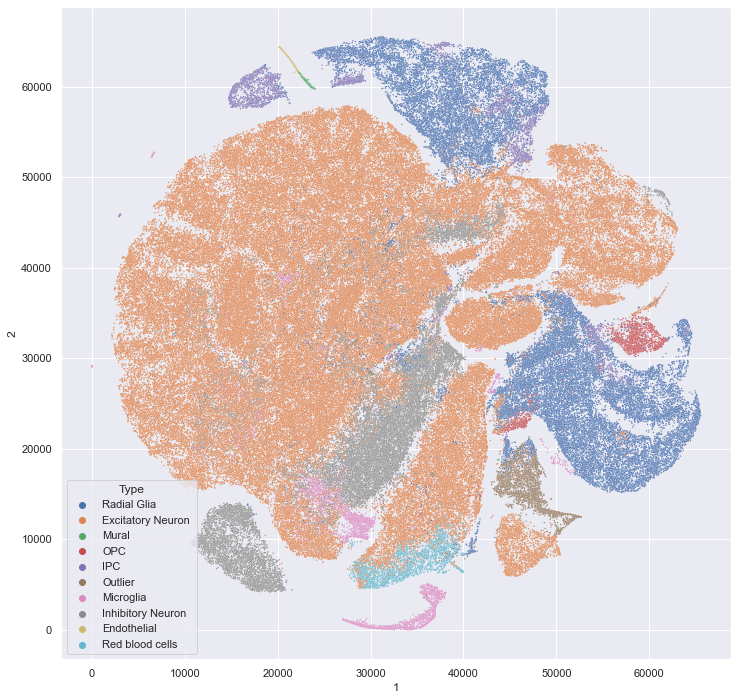

In [38]:
type_plot = sns.scatterplot(data=df_primary, x=1, y=2, hue='Type', s=2);

fig = type_plot.get_figure()
fig.savefig('type_cluster_primary.png')

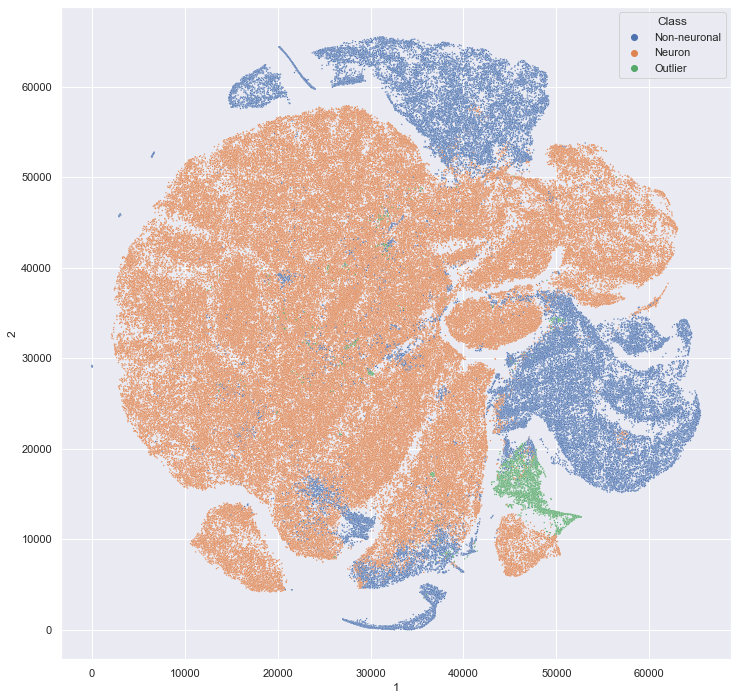

In [39]:
type_plot = sns.scatterplot(data=df_primary, x=1, y=2, hue='Class', s=2);

fig = type_plot.get_figure()
fig.savefig('class_cluster_primary.png')

## Visualizing using Plotly

In [7]:
px.scatter(
    x=df_primary.loc[:, 1],
    y=df_primary.loc[:, 2],
    color=df_primary['Class'],
    title='t-SNE projected (dim=2) primary cell data, colored by class',
).update_traces(marker=dict(size=2)).show()

In [12]:
df_organoid['Age'].unique()

array([ 3,  5,  8, 10])

In [13]:
df_primary['Age'].unique()

array([14, 18, 22,  6, 10])

In [14]:
px.scatter(
    x=df_organoid.loc[df_organoid['Age'] == 10, :].loc[:, 1],
    y=df_organoid.loc[df_organoid['Age'] == 10, :].loc[:, 2],
    color=df_organoid.loc[df_organoid['Age'] == 10, :]['Class'],
    title='t-SNE projected (dim=2) organoid cell data, week 10, colored by class',
    
).update_traces(marker=dict(size=2)).show()

px.scatter(
    x=df_primary.loc[df_primary['Age'] == 10, :].loc[:, 1],
    y=df_primary.loc[df_primary['Age'] == 10, :].loc[:, 2],
    color=df_primary.loc[df_primary['Age'] == 10, :]['Class'],
    title='t-SNE projected (dim=2) primary cell data, week 10, colored by class',
).update_traces(marker=dict(size=2)).show()

In [84]:
px.scatter(x=embedding[:, 0], y=embedding[:, 1], color=organoid_subset.T.index)